In [1]:
import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
# import rapids_singlecell as rsc
import scanpy as sc
import seaborn as sns

In [2]:
raw_data_12 = pd.read_csv('./QuPath/Codex_fibroblasts_TMA_12_13_v2_postQC/12_v1.csv')
raw_data_13 = pd.read_csv('./QuPath/Codex_fibroblasts_TMA_12_13_v2_postQC/13_v1.csv')
raw_data_21 = pd.read_csv('./QuPath/Codex_GS/raw_data_21.csv')
raw_data_22 = pd.read_csv('./QuPath/Codex_GS/raw_data_22.csv')

In [3]:
raw_data_13 = raw_data_13.rename(columns={'CRABP2 (C37): Cell: Mean':'CRABP2: Cell: Mean',
                                          'CD4 (C21): Cell: Mean':'CD4: Cell: Mean',
                                          'CD20 (C5): Cell: Mean':'CD20: Cell: Mean',
                                          'SMA (C18): Cell: Mean': 'SMA: Cell: Mean',
                                          'Pan-Cytokeratin (C32): Cell: Mean': 'Pan-Cytokeratin: Cell: Mean'})

raw_data_12 = raw_data_12.rename(columns={'SMA (C18): Cell: Mean': 'SMA: Cell: Mean',
                                          'Pan-Cytokeratin (C32): Cell: Mean': 'Pan-Cytokeratin: Cell: Mean'})

raw_data_12 = raw_data_12.fillna(value=0)
raw_data_13 = raw_data_13.fillna(value=0)
raw_data_21 = raw_data_21.fillna(value=0)
raw_data_22 = raw_data_22.fillna(value=0)

In [4]:
markers = [col for col in raw_data_13.columns if 'Cell: Mean' in col]

def z_score(frame, column):
    z_scores = (frame[column] - np.mean(frame[column])) / np.std(frame[column])
    return z_scores

for marker in markers:
    raw_data_12[f'{marker.split(": ")[0]}_z'] = z_score(frame=raw_data_12, column=marker)
    raw_data_13[f'{marker.split(": ")[0]}_z'] = z_score(frame=raw_data_13, column=marker)
    raw_data_21[f'{marker.split(": ")[0]}_z'] = z_score(frame=raw_data_21, column=marker)
    raw_data_22[f'{marker.split(": ")[0]}_z'] = z_score(frame=raw_data_22, column=marker)

In [5]:
raw_data = pd.concat([raw_data_12, raw_data_13, raw_data_21, raw_data_22])

del raw_data_12
del raw_data_13
del raw_data_21
del raw_data_22

raw_data = raw_data.reset_index()
raw_data = raw_data[raw_data['TMA core'] != 0] # Some cells were out of bounds of the core, assigned '0' as their parent core; we remove these

def reformat_core_id(name):
    row_number = name.split('-')[0]
    col_number = name.split('-')[1]
    if len(row_number) < 2:
        new_row_number = '0' + str(row_number)
    else:
        new_row_number = str(row_number)
    return new_row_number + '-' + col_number

def extract_tma_number(name):
    if name.split('_')[0] == 'LUNG':
        x = name.split('_')[3]
    else:
        x = name.split('_')[2]
    return x

# raw_data['TMA'] = raw_data['Image'].apply(lambda x: x.split('_')[3])
raw_data['TMA'] = raw_data['Image'].apply(lambda x: extract_tma_number(x))
raw_data['core'] = raw_data['TMA core'].apply(lambda x: reformat_core_id(x))
raw_data['core_ID'] = raw_data['TMA'] + '-' + raw_data['core']

raw_data[['Image', 'core_ID', 'TMA', 'core']]

In [6]:
raw_data = raw_data.drop(columns=['Object ID', 'Object type', 'Name', 'Classification', 'ROI', 'Image', 'TMA core', 'Parent'])

In [7]:
cell_means = raw_data[['TMA', 'core_ID', 'Centroid X µm', 'Centroid Y µm', 'Nucleus: Area µm^2']+[col for col in raw_data.columns if '_z' in col]]
cell_means['nucleus_area_z'] = z_score(frame=cell_means, column='Nucleus: Area µm^2')
cell_means = cell_means.rename(columns={'Pan-Cytokeratin_z':'CKPAN_z',
                                            'SMA_z':'SMA_z',
                                            'E-cadherin_z':'ECAD_z',
                                            'Collagen IV_z':'COLIV_z',
                                            'Centroid X µm':'CellX',
                                            'Centroid Y µm':'CellY'})
cell_means

/tmp/ipykernel_785358/2846330149.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_means['nucleus_area_z'] = z_score(frame=cell_means, column='Nucleus: Area µm^2')


,TMA,core_ID,CellX,CellY,Nucleus: Area µm^2,DAPI_z,CD105_z,CD31_z,FAP_z,CD20_z,...,LIF_z,S100A4_z,PDGFR_z,CTGF_z,CRABP2_z,Vimentin_z,IL6_z,HNF4A_z,CXCR4_z,nucleus_area_z
0,12,12-15-J,2396.8,6263.1,95.7493,-0.627585,-0.013668,0.601459,-0.379995,-0.267708,...,-0.082722,-0.648865,-0.127361,-0.200415,-0.424465,0.118393,-0.349774,-0.889066,-0.779561,1.008868
1,12,12-15-J,2420.0,6264.4,71.8626,-0.118966,0.064999,-0.145439,-0.161429,-0.172859,...,1.530275,-0.202656,-0.042321,1.547682,0.729145,-0.702967,-0.033482,-0.213493,-0.092214,0.317205
2,12,12-15-J,2428.9,6265.5,62.8158,-0.328814,-0.011850,-0.116844,-0.127924,-0.231012,...,1.328029,-0.338006,-0.056772,1.170539,0.298539,-0.576913,-0.155474,-0.374000,-0.434815,0.055247
3,12,12-15-J,2409.4,6267.8,95.7251,-0.944878,-0.228929,-0.110528,-0.385739,-0.298581,...,0.941878,-0.578768,-0.140979,0.241471,0.586612,-0.588000,-0.211427,-0.572326,-0.576649,1.008167
4,12,12-15-J,2474.5,6266.5,96.7594,-1.215765,-0.369253,-0.458058,-0.577260,-0.628342,...,-0.297052,-0.858646,-0.266316,-1.053882,-0.623115,-0.333306,-0.438181,-1.054936,-1.048774,1.038116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2831033,22,22-16-J,16852.9,21940.5,NaN,1.754097,0.999584,-0.393765,3.142073,-0.170504,...,-0.273847,1.096317,1.485579,1.570957,-0.172892,-0.108469,0.293524,0.698709,0.423802,NaN
2831034,22,22-16-J,17745.1,22493.3,NaN,0.356478,0.081806,-0.520936,1.166418,-0.416338,...,-0.654355,-0.001641,0.919286,-0.628659,-0.503952,-0.204279,-0.282733,0.634031,0.056542,NaN
2831035,22,22-16-J,17987.3,22119.8,NaN,-0.338557,1.011690,-0.556372,0.449826,-0.479073,...,-0.284974,1.530580,4.120637,1.969090,1.476970,-0.917261,-0.600539,1.328930,0.293107,NaN
2831036,22,22-16-J,16817.0,22022.3,NaN,-1.054210,-0.993372,-0.152242,-0.659798,-0.482373,...,-1.086854,-0.488224,-0.822995,-0.258122,-0.706714,-0.297189,-0.461325,-0.212643,-0.215891,NaN


In [8]:
cell_means = cell_means.drop(columns='nucleus_area_z')
cell_means

,TMA,core_ID,CellX,CellY,Nucleus: Area µm^2,DAPI_z,CD105_z,CD31_z,FAP_z,CD20_z,...,CKPAN_z,LIF_z,S100A4_z,PDGFR_z,CTGF_z,CRABP2_z,Vimentin_z,IL6_z,HNF4A_z,CXCR4_z
0,12,12-15-J,2396.8,6263.1,95.7493,-0.627585,-0.013668,0.601459,-0.379995,-0.267708,...,-0.353372,-0.082722,-0.648865,-0.127361,-0.200415,-0.424465,0.118393,-0.349774,-0.889066,-0.779561
1,12,12-15-J,2420.0,6264.4,71.8626,-0.118966,0.064999,-0.145439,-0.161429,-0.172859,...,0.817938,1.530275,-0.202656,-0.042321,1.547682,0.729145,-0.702967,-0.033482,-0.213493,-0.092214
2,12,12-15-J,2428.9,6265.5,62.8158,-0.328814,-0.011850,-0.116844,-0.127924,-0.231012,...,1.309084,1.328029,-0.338006,-0.056772,1.170539,0.298539,-0.576913,-0.155474,-0.374000,-0.434815
3,12,12-15-J,2409.4,6267.8,95.7251,-0.944878,-0.228929,-0.110528,-0.385739,-0.298581,...,1.284012,0.941878,-0.578768,-0.140979,0.241471,0.586612,-0.588000,-0.211427,-0.572326,-0.576649
4,12,12-15-J,2474.5,6266.5,96.7594,-1.215765,-0.369253,-0.458058,-0.577260,-0.628342,...,-0.402905,-0.297052,-0.858646,-0.266316,-1.053882,-0.623115,-0.333306,-0.438181,-1.054936,-1.048774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2831033,22,22-16-J,16852.9,21940.5,NaN,1.754097,0.999584,-0.393765,3.142073,-0.170504,...,-0.510559,-0.273847,1.096317,1.485579,1.570957,-0.172892,-0.108469,0.293524,0.698709,0.423802
2831034,22,22-16-J,17745.1,22493.3,NaN,0.356478,0.081806,-0.520936,1.166418,-0.416338,...,-0.483564,-0.654355,-0.001641,0.919286,-0.628659,-0.503952,-0.204279,-0.282733,0.634031,0.056542
2831035,22,22-16-J,17987.3,22119.8,NaN,-0.338557,1.011690,-0.556372,0.449826,-0.479073,...,-0.448892,-0.284974,1.530580,4.120637,1.969090,1.476970,-0.917261,-0.600539,1.328930,0.293107
2831036,22,22-16-J,16817.0,22022.3,NaN,-1.054210,-0.993372,-0.152242,-0.659798,-0.482373,...,-0.510145,-1.086854,-0.488224,-0.822995,-0.258122,-0.706714,-0.297189,-0.461325,-0.212643,-0.215891


In [9]:
# markers_to_use = ['DAPI_z', 'CKPAN_z', 'GATA6_z', 'ECAD_z', 'CA9_z', 'NCAD_z', 'GREM1_z', 'LIF_z', 'S100A4_z', 'HNF4A_z', 'CD20_z', 'CD38_z', 'CD45_z', 'CD8_z', 'CD4_z', 'HLA-DR_z', 'CD31_z', 'CD105_z', 'FAP_z', 'Podoplanin_z', 'SMA_z', 'COL1A_z', 'DECORIN_z', 'COLIV_z', 'nucleus_area_z']
markers_to_use = ['CKPAN_z', 'GATA6_z', 'CD68_z', 'ECAD_z', 'CA9_z', 'NCAD_z', 'GREM1_z', 'LIF_z', 'S100A4_z', 'HNF4A_z', 'CD20_z', 'CD38_z', 'CD45_z', 'CD8_z', 'CD4_z', 'HLA-DR_z', 'CD31_z', 'CD105_z', 'Podoplanin_z', 'SMA_z', 'COL1A_z', 'DECORIN_z', 'COLIV_z', 'Vimentin_z', 'FAP_z', 'IL6_z']
# markers_to_use = ['CKPAN_z', 'CD45_z', 'CD20_z', 'CD4_z', 'CD8_z', 'SMA_z']

adata = ad.AnnData(X=cell_means[[col for col in cell_means.columns if col in markers_to_use]], obs=cell_means[['core_ID', 'CellX', 'CellY']])
adata.obs['TMA'] = adata.obs['core_ID'].apply(lambda x: x.split('-')[0])
adata.obs

In [10]:
adata.var_names

Index(['CD105_z', 'CD31_z', 'FAP_z', 'CD20_z', 'CD68_z', 'CD38_z', 'CD45_z',
       'Podoplanin_z', 'GATA6_z', 'HLA-DR_z', 'COL1A_z', 'CA9_z', 'CD8_z',
       'SMA_z', 'DECORIN_z', 'ECAD_z', 'CD4_z', 'GREM1_z', 'COLIV_z', 'NCAD_z',
       'CKPAN_z', 'LIF_z', 'S100A4_z', 'Vimentin_z', 'IL6_z', 'HNF4A_z'],
      dtype='object')

In [17]:
## Import the leiden clusters from the H&Es

clusters_frame_bioclavis = pd.read_csv('./results/BarlowTwins_3/LATTICeA_5x/h224_w224_n3_zdim128_filtered/rapids_2p5m/adatas/LATTICeA_BioclavisHE_4pc_5x_he_train_filtered_leiden_2p5__fold2.csv')
clusters_frame_gs = pd.read_csv('./results/BarlowTwins_3/LATTICeA_5x/h224_w224_n3_zdim128_filtered/rapids_2p5m/adatas/LATTICeA_GrandSlam_4pc_5x_he_combined_filtered_leiden_2p5__fold2.csv')
clusters_frame_gs = clusters_frame_gs.rename(columns={'combined_samples':'samples',
                                                      'combined_slides':'slides',
                                                      'combined_tiles':'tiles'})



clusters_frame_bioclavis['core_ID'] = clusters_frame_bioclavis['slides'].apply(lambda x: x.split('_')[2])
clusters_frame_bioclavis['TMA'] = clusters_frame_bioclavis['core_ID'].apply(lambda x: x.split('-')[0])

clusters_frame_gs['core_ID'] = clusters_frame_gs['slides'].apply(lambda x: x.split('_')[2])
clusters_frame_gs['TMA'] = clusters_frame_gs['core_ID'].apply(lambda x: x.split('-')[0])

clusters_frame_bioclavis = clusters_frame_bioclavis.loc[(clusters_frame_bioclavis['TMA'] == '12') | (clusters_frame_bioclavis['TMA'] == '13')]
clusters_frame_gs = clusters_frame_gs.loc[(clusters_frame_gs['TMA'] == '21') | (clusters_frame_gs['TMA'] == '22')]

clusters_frame = pd.concat([clusters_frame_bioclavis, clusters_frame_gs])
leiden_clusters = np.unique(clusters_frame['leiden_2.5'])
clusters_frame['core'] = clusters_frame['slides'].apply(lambda x: x[9:])


In [32]:
unique_core_samples = clusters_frame[['core', 'samples']].drop_duplicates()
unique_core_samples = unique_core_samples.set_index('core')
core_dict = unique_core_samples.to_dict()['samples']
adata.obs['samples'] = adata.obs['core_ID'].map(core_dict)
adata.obs

,core_ID,CellX,CellY,TMA,samples,leiden_0.5,leiden_0.6,leiden_0.8,leiden_1.0,leiden_1.5,leiden_2.0,cell_lineage,immune_lineage
cell_0,12-15-J,2396.8,6263.1,12,ACA_0662,21,26,25,31,45,56,stroma,NaN
cell_1,12-15-J,2420.0,6264.4,12,ACA_0662,5,30,18,38,5,5,tumour,NaN
cell_2,12-15-J,2428.9,6265.5,12,ACA_0662,5,30,18,38,65,5,tumour,NaN
cell_3,12-15-J,2409.4,6267.8,12,ACA_0662,5,30,18,38,5,5,tumour,NaN
cell_4,12-15-J,2474.5,6266.5,12,ACA_0662,9,13,28,33,51,62,unclassifiable,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell_2670918,22-15-J,17607.6,20332.7,22,ACA_1069,26,13,36,45,58,75,immune,CD45+ CD4+
cell_2670919,22-15-J,17733.6,20460.9,22,ACA_1069,26,15,9,13,21,27,immune,CD45+ CD20+
cell_2670920,22-15-J,17500.8,20961.7,22,ACA_1069,26,15,33,45,10,12,stroma,NaN
cell_2670921,22-15-J,17685.7,20402.6,22,ACA_1069,26,20,36,45,21,27,immune,CD45+ CD20+


In [13]:
adata = adata[~adata.obs['samples'].isna()]
adata.obs

,core_ID,CellX,CellY,TMA,samples
0,12-15-J,2396.8,6263.1,12,ACA_0662
1,12-15-J,2420.0,6264.4,12,ACA_0662
2,12-15-J,2428.9,6265.5,12,ACA_0662
3,12-15-J,2409.4,6267.8,12,ACA_0662
4,12-15-J,2474.5,6266.5,12,ACA_0662
...,...,...,...,...,...
2817520,22-15-J,17607.6,20332.7,22,ACA_1069
2817521,22-15-J,17733.6,20460.9,22,ACA_1069
2817522,22-15-J,17500.8,20961.7,22,ACA_1069
2817523,22-15-J,17685.7,20402.6,22,ACA_1069


In [14]:
adata.write_h5ad('00_data/01_adata_inc_gs_TMAs_unclustered_normalised_values.h5')

In [2]:
# Start from here -- UMAPs on the whole set of data

adata = ad.read_h5ad('./codex/00_data/01_adata_inc_gs_TMAs_unclustered_normalised_values.h5')
adata.obs

,core_ID,CellX,CellY,TMA,samples
0,12-15-J,2396.8,6263.1,12,ACA_0662
1,12-15-J,2420.0,6264.4,12,ACA_0662
2,12-15-J,2428.9,6265.5,12,ACA_0662
3,12-15-J,2409.4,6267.8,12,ACA_0662
4,12-15-J,2474.5,6266.5,12,ACA_0662
...,...,...,...,...,...
2817520,22-15-J,17607.6,20332.7,22,ACA_1069
2817521,22-15-J,17733.6,20460.9,22,ACA_1069
2817522,22-15-J,17500.8,20961.7,22,ACA_1069
2817523,22-15-J,17685.7,20402.6,22,ACA_1069


In [3]:
adata.var_names

Index(['CD105_z', 'CD31_z', 'FAP_z', 'CD20_z', 'CD68_z', 'CD38_z', 'CD45_z',
       'Podoplanin_z', 'GATA6_z', 'HLA-DR_z', 'COL1A_z', 'CA9_z', 'CD8_z',
       'SMA_z', 'DECORIN_z', 'ECAD_z', 'CD4_z', 'GREM1_z', 'COLIV_z', 'NCAD_z',
       'CKPAN_z', 'LIF_z', 'S100A4_z', 'Vimentin_z', 'IL6_z', 'HNF4A_z'],
      dtype='object')

In [4]:
sc.pp.neighbors(adata, n_neighbors=15, method='rapids', metric='euclidean', key_added='nn_leiden')
sc.tl.umap(adata, min_dist=0.5, spread=1.0, n_components=2, neighbors_key='nn_leiden', method='rapids')

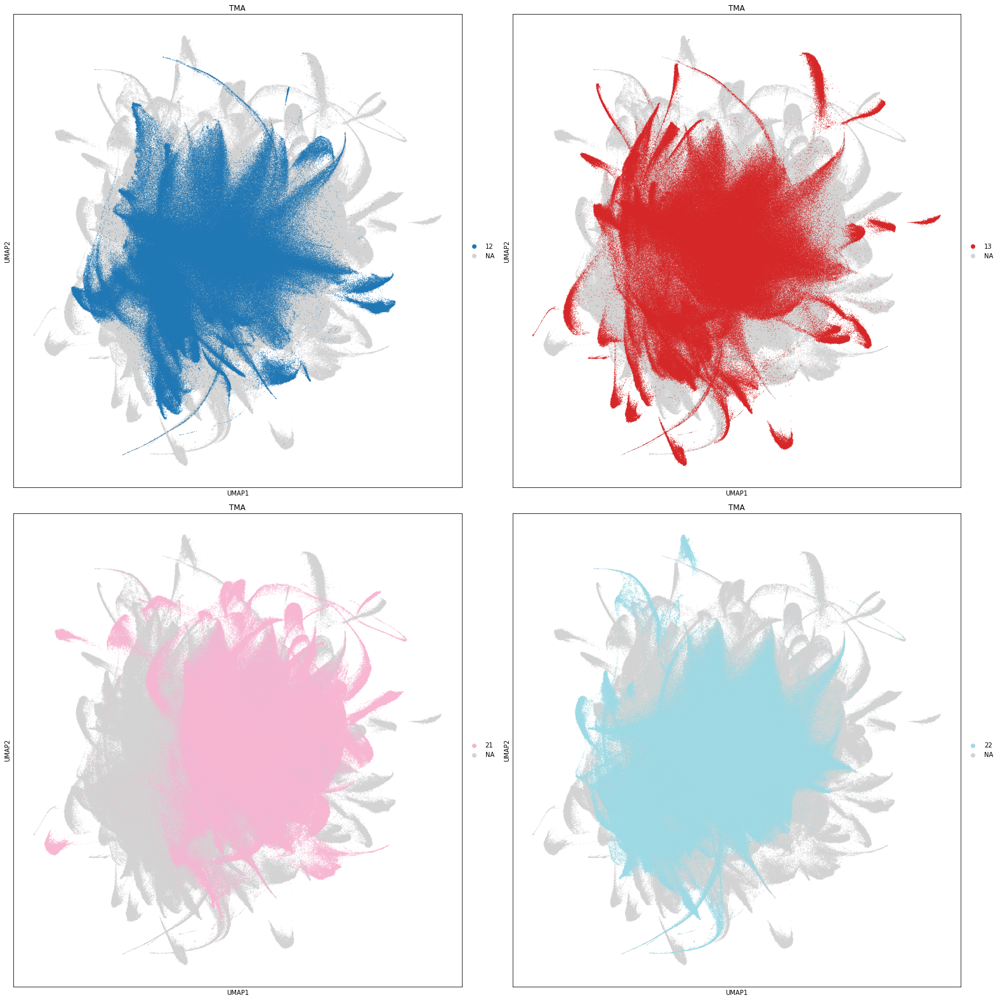

In [5]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(22,22))
axs = axs.flatten()

for i, tma in enumerate(['12', '13', '21', '22']):
    sc.pl.umap(adata=adata, color='TMA', palette='tab20', size=3, ax=axs[i], groups=[tma], show=False)
# sc.pl.umap(adata=adata, color='samples', palette='tab20', size=2, groups=['ACA_0677', 'ACA_0682'], ax=ax)

plt.tight_layout()
plt.show()

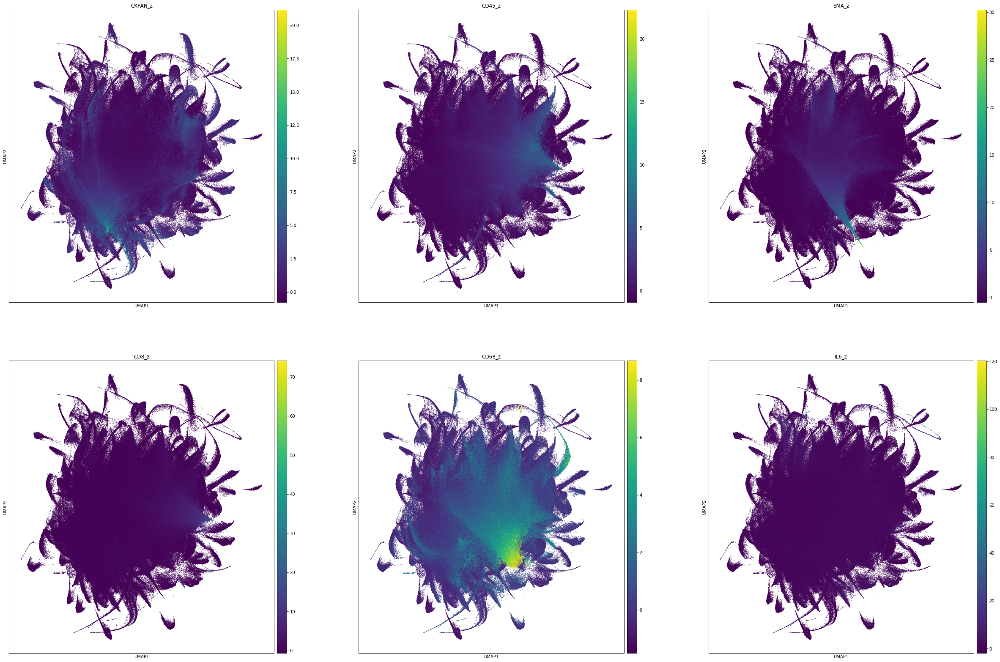

In [6]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(42,28))
axs = axs.flatten()

lineage_markers = ['CKPAN_z', 'CD45_z', 'SMA_z', 'CD8_z', 'CD68_z', 'IL6_z']

for i, marker in enumerate(lineage_markers):
    sc.pl.umap(adata=adata, color=marker, palette='tab20', size=3, show=False, ax=axs[i])

In [7]:
# resolutions = [0.2, 0.4, 0.5, 0.6, 0.8, 1.0, 1.5, 2.0]
resolutions = [0.5, 0.6, 0.8, 1.0, 1.5, 2.0]

for resolution in resolutions:
    rsc.tl.leiden(adata=adata, resolution=resolution, key_added=f'leiden_{resolution}', neighbors_key='nn_leiden')


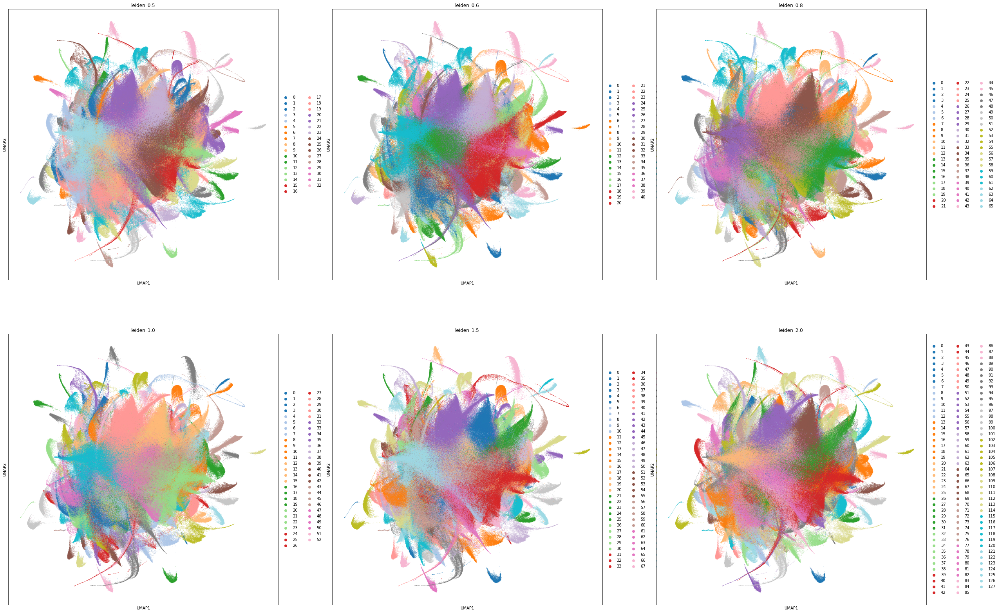

In [8]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(42,28))
axs = axs.flatten()

for i, resolution in enumerate(resolutions):
    sc.pl.umap(adata=adata, color=f'leiden_{resolution}', palette='tab20', size=2, ax=axs[i], show=False)

plt.show()

In [9]:
def plot_leiden_clusters_boxplot(adata, resolution, markers, nrows, ncols, groups=None):
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10,nrows*8), sharey=False)
    axs = axs.flatten()

    if groups is not None:
        leiden_clusters = sorted(int(cluster) for cluster in groups)
    else:
        leiden_clusters = sorted([int(cluster) for cluster in list(np.unique(adata.obs[f'leiden_{resolution}']))])

    for i, leiden in enumerate(leiden_clusters):
        subset = adata.X[adata.obs[f'leiden_{resolution}'] == str(leiden)]
        sns.boxplot(data=subset, width=0.5, ax=axs[i])
        axs[i].set_title(f'{leiden}')
        axs[i].tick_params(axis='x', labelrotation=45)
        axs[i].set_xticks(ticks=axs[i].get_xticks(), labels=markers)
        axs[i].axhline(y=0)
        if groups is not None:
            axs[i].set_ylim([-3, 20])

In [11]:
plot_leiden_clusters_boxplot(adata=adata, resolution=2.0, markers=adata.var_names, nrows=32, ncols=4)

In [12]:
# Some clusters needed the scale adjusted so replot these for better visualisation
plot_leiden_clusters_boxplot(adata=adata, resolution=2.0, markers=adata.var_names, nrows=2, ncols=4, groups=[21, 44, 117])

In [18]:
# Review clusters visually on QuPath

tma_num = '22'

adata.obs.loc[(adata.obs['TMA'] == tma_num)][['CellX', 'CellY', 'leiden_2.0']].to_csv(f'/mnt/cephfs/home/users/krakovic/sharedscratch/QuPath/Codex_fibroblasts_TMA_12_13_v2_postQC/tma_{tma_num}_leiden_phenotypes.csv')

In [19]:
adata.write_h5ad('./LUAD_markers_clustered_2p0_4slides.h5ad')

### Assign phenotypes

In [3]:
adata = ad.read_h5ad('/nfs/home/users/krakovic/sharedscratch/notebooks/latticea_he/codex/00_data/LUAD_markers_clustered_2p0_4slides.h5ad')
adata.obs

,core_ID,CellX,CellY,TMA,samples,leiden_0.5,leiden_0.6,leiden_0.8,leiden_1.0,leiden_1.5,leiden_2.0
0,12-15-J,2396.8,6263.1,12,ACA_0662,21,26,25,31,45,56
1,12-15-J,2420.0,6264.4,12,ACA_0662,5,30,18,38,5,5
2,12-15-J,2428.9,6265.5,12,ACA_0662,5,30,18,38,65,5
3,12-15-J,2409.4,6267.8,12,ACA_0662,5,30,18,38,5,5
4,12-15-J,2474.5,6266.5,12,ACA_0662,9,13,28,33,51,62
...,...,...,...,...,...,...,...,...,...,...,...
2817520,22-15-J,17607.6,20332.7,22,ACA_1069,26,13,36,45,58,75
2817521,22-15-J,17733.6,20460.9,22,ACA_1069,26,15,9,13,21,27
2817522,22-15-J,17500.8,20961.7,22,ACA_1069,26,15,33,45,10,12
2817523,22-15-J,17685.7,20402.6,22,ACA_1069,26,20,36,45,21,27


In [4]:
# Map leiden clusters to real lineages after visual review
lineage_dictionary = {'0':'stroma', '1':'tumour', '2':'stroma', '3':'stroma', '4':'stroma', '5':'tumour', '6':'tumour', '7':'tumour', '8':'tumour', '9':'tumour', 
                      '10':'stroma', '11':'unclassifiable', '12':'stroma', '13':'stroma', '14':'tumour', '15':'tumour', '16':'tumour', '17':'unclassifiable', '18':'tumour', '19':'tumour',
                      '20':'tumour', '21':'stroma', '22':'tumour', '23':'stroma', '24':'tumour', '25':'tumour', '26':'tumour', '27':'immune', '28':'tumour', '29':'tumour',
                      '30':'tumour', '31':'stroma', '32':'tumour', '33':'tumour', '34':'tumour', '35':'tumour', '36':'tumour', '37':'tumour', '38':'tumour', '39':'tumour', 
                      '40':'immune', '41':'immune', '42':'immune', '43':'tumour', '44':'unclassifiable', '45':'tumour', '46':'tumour', '47':'tumour', '48':'tumour', '49':'tumour',
                      '50':'tumour', '51':'tumour', '52':'stroma', '53':'tumour', '54':'unclassifiable', '55':'immune', '56':'stroma', '57':'tumour', '58':'stroma', '59':'immune',
                      '60':'tumour', '61':'stroma', '62':'unclassifiable', '63':'tumour', '64':'tumour', '65':'tumour', '66':'tumour', '67':'tumour', '68':'immune', '69':'tumour',
                      '70':'tumour', '71':'tumour', '72':'unclassifiable', '73':'tumour', '74':'tumour', '75':'immune', '76':'tumour', '77':'tumour', '78':'tumour', '79':'unclassifiable',
                      '80':'unclassifiable', '81':'tumour', '82':'tumour', '83':'tumour', '84':'tumour', '85':'stroma', '86':'unclassifiable', '87':'tumour', '88':'tumour', '89':'tumour',
                      '90':'tumour', '91':'unclassifiable', '92':'tumour', '93':'unclassifiable', '94':'stroma', '95':'unclassifiable', '96':'tumour', '97':'tumour', '98':'unclassifiable', '99':'tumour',
                      '100':'tumour', '101':'tumour', '102':'tumour', '103':'tumour', '104':'tumour', '105':'tumour', '106':'immune', '107':'unclassifiable', '108':'tumour', '109':'tumour',
                      '110':'tumour', '111':'tumour', '112':'tumour', '113':'unclassifiable', '114':'tumour', '115':'immune', '116':'tumour', '117':'stroma', '118':'tumour', '119':'tumour',
                      '120':'tumour', '121':'tumour', '122':'stroma', '123':'tumour', '124':'tumour', '125':'tumour', '126':'tumour', '127':'tumour'}

# Cores where phenotyping was unsuccessful: 12-10-B, 12-06-A, 21-14-J, 21-15-J

adata.obs['cell_lineage'] = adata.obs['leiden_2.0'].map(lineage_dictionary)
immune_subtypes = {'27':'CD45+ CD20+', '40':'CD45+ CD68+', '41':'CD45+ CD8+', '42':'CD45+ CD68+', '55':'CD45+ CD68+', '59':'CD45+ CD4+', '68':'CD45+ CD38+', '75':'CD45+ CD4+', '106':'CD45+ CD68+', '115':'CD45+ CD68+'}
adata.obs['immune_lineage'] = adata.obs['leiden_2.0'].map(immune_subtypes)

cores_to_exclude = ['12-10-B', '12-06-A', '21-14-J', '21-15-J']
adata = adata[~adata.obs['core_ID'].isin(cores_to_exclude)]

adata.obs

,core_ID,CellX,CellY,TMA,samples,leiden_0.5,leiden_0.6,leiden_0.8,leiden_1.0,leiden_1.5,leiden_2.0,cell_lineage,immune_lineage
0,12-15-J,2396.8,6263.1,12,ACA_0662,21,26,25,31,45,56,stroma,NaN
1,12-15-J,2420.0,6264.4,12,ACA_0662,5,30,18,38,5,5,tumour,NaN
2,12-15-J,2428.9,6265.5,12,ACA_0662,5,30,18,38,65,5,tumour,NaN
3,12-15-J,2409.4,6267.8,12,ACA_0662,5,30,18,38,5,5,tumour,NaN
4,12-15-J,2474.5,6266.5,12,ACA_0662,9,13,28,33,51,62,unclassifiable,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2817520,22-15-J,17607.6,20332.7,22,ACA_1069,26,13,36,45,58,75,immune,CD45+ CD4+
2817521,22-15-J,17733.6,20460.9,22,ACA_1069,26,15,9,13,21,27,immune,CD45+ CD20+
2817522,22-15-J,17500.8,20961.7,22,ACA_1069,26,15,33,45,10,12,stroma,NaN
2817523,22-15-J,17685.7,20402.6,22,ACA_1069,26,20,36,45,21,27,immune,CD45+ CD20+


In [5]:
# Cluster 86 follows a pattern according to core

adata.obs.loc[(adata.obs['core_ID'] == '13-11-A') & (adata.obs['leiden_2.0'] == '86'), 'cell_lineage'] = 'tumour'
adata.obs.loc[(adata.obs['core_ID'] == '13-10-A') & (adata.obs['leiden_2.0'] == '86'), 'cell_lineage'] = 'unclassifiable'
adata.obs.loc[(adata.obs['core_ID'] == '13-09-A') & (adata.obs['leiden_2.0'] == '86'), 'cell_lineage'] = 'immune'
adata.obs.loc[(adata.obs['core_ID'] == '13-09-A') & (adata.obs['leiden_2.0'] == '86'), 'immune_lineage'] = 'CD45+ CD68+'

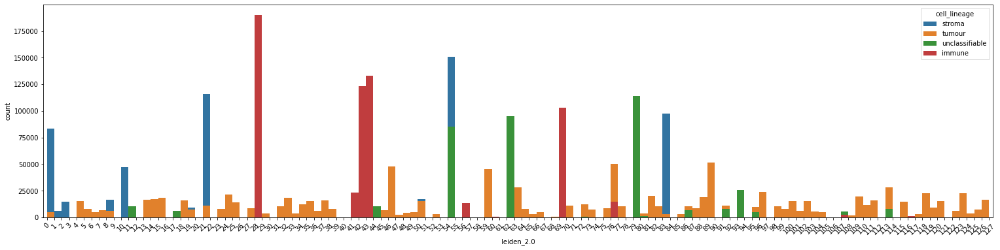

In [6]:
fig, ax = plt.subplots(figsize=(26,6))
sns.countplot(x='leiden_2.0', hue='cell_lineage', data=adata.obs, width=4, ax=ax)
ax.tick_params(axis='x', labelrotation=45)

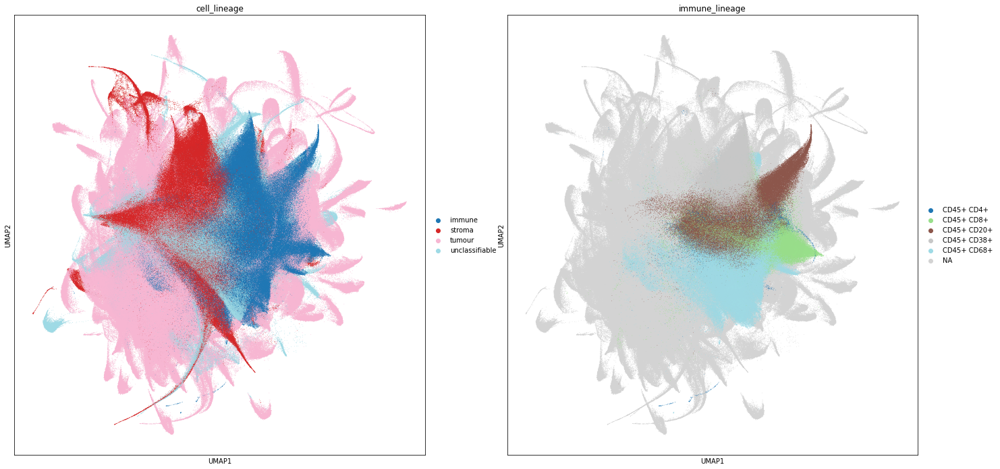

In [8]:
fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(24,12))
axs = axs.flatten()

sc.pl.umap(adata=adata, color='cell_lineage', palette='tab20', size=2, ax=axs[0], show=False)
sc.pl.umap(adata=adata, color='immune_lineage', palette='tab20', size=2, ax=axs[1], show=False)

plt.show()

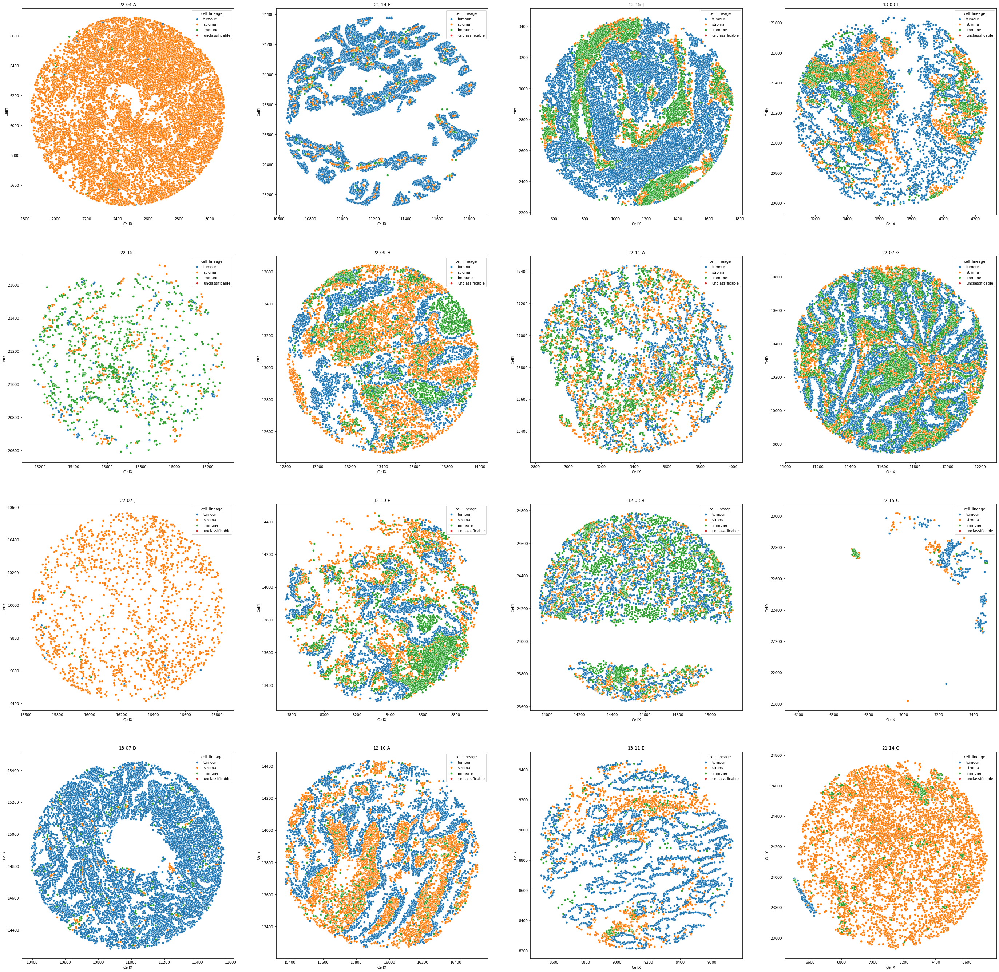

In [27]:
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(48,48))
axs = axs.flatten()

all_cores = np.unique(adata.obs['core_ID'].values)
random_cores = np.random.choice(all_cores, size=(1,16))

for i, core in enumerate(random_cores[0]):
    sns.scatterplot(x='CellX', y='CellY', hue='cell_lineage', data=adata.obs[adata.obs['core_ID'] == core], hue_order=['tumour', 'stroma', 'immune', 'unclassificable'], ax=axs[i])
    axs[i].set_title(core)
# sns.scatterplot(x='CellX', y='CellY', hue='cell_lineage', data=adata.obs[adata.obs['core_ID'] == '13-06-F'], hue_order=['tumour', 'stroma', 'immune', 'unclassificable'], ax=ax)

In [7]:
adata.obs_names = [f'cell_{x}' for x in range(len(adata.obs_names))]
adata.obs_names

Index(['cell_0', 'cell_1', 'cell_2', 'cell_3', 'cell_4', 'cell_5', 'cell_6',
       'cell_7', 'cell_8', 'cell_9',
       ...
       'cell_2670913', 'cell_2670914', 'cell_2670915', 'cell_2670916',
       'cell_2670917', 'cell_2670918', 'cell_2670919', 'cell_2670920',
       'cell_2670921', 'cell_2670922'],
      dtype='object', length=2670923)

In [8]:
adata.write_h5ad('./03_LUAD_markers_clustered_2p0_4slides_with_phenotypes.h5ad')

### Phenotype plots and preprocess clusters

In [ ]:
adata = ad.read_h5ad('./03_LUAD_markers_clustered_2p0_4slides_with_phenotypes.h5ad')
adata

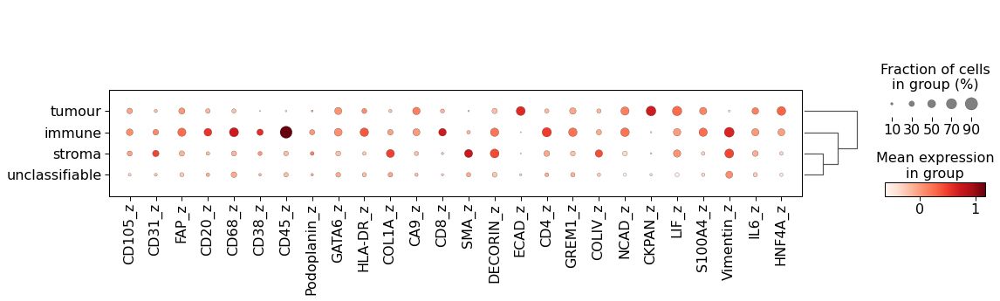

In [9]:
sns.set_context("paper", font_scale=2.0)

sc.tl.dendrogram(adata=adata, groupby='cell_lineage')
fig, ax = plt.subplots(figsize=(18,4))
sc.pl.dotplot(adata, var_names=adata.var_names, groupby="cell_lineage", dendrogram=True, ax=ax)

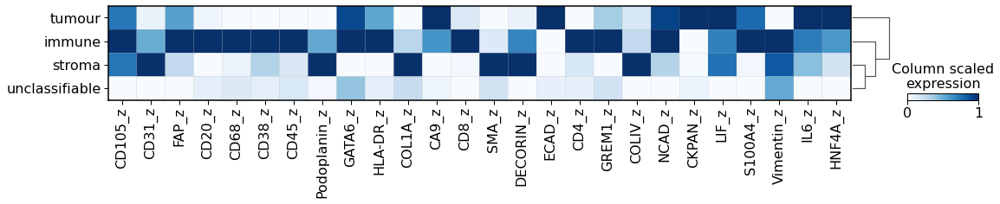

In [12]:
sc.pl.matrixplot(adata, var_names=adata.var_names, groupby='cell_lineage', dendrogram=True, cmap='Blues', standard_scale='var', colorbar_title="Column scaled\nexpression", figsize=(18,2))

In [13]:
adata_stroma = adata[adata.obs['cell_lineage'] == 'stroma'].copy()
adata_stroma.obs

,core_ID,CellX,CellY,TMA,samples,leiden_0.5,leiden_0.6,leiden_0.8,leiden_1.0,leiden_1.5,leiden_2.0,cell_lineage,immune_lineage
cell_0,12-15-J,2396.8,6263.1,12,ACA_0662,21,26,25,31,45,56,stroma,NaN
cell_16,12-15-J,2576.0,6276.9,12,ACA_0662,21,26,25,31,45,85,stroma,NaN
cell_23,12-15-J,2384.6,6281.8,12,ACA_0662,21,26,25,31,45,56,stroma,NaN
cell_32,12-15-J,2508.0,6289.9,12,ACA_0662,21,26,25,31,45,56,stroma,NaN
cell_36,12-15-J,2392.0,6290.7,12,ACA_0662,21,26,25,31,45,56,stroma,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell_2670889,22-15-J,17466.5,21102.6,22,ACA_1069,21,26,25,31,65,85,stroma,NaN
cell_2670895,22-15-J,17132.9,20327.1,22,ACA_1069,46,55,28,74,97,23,stroma,NaN
cell_2670899,22-15-J,16799.7,20627.6,22,ACA_1069,21,26,25,31,45,56,stroma,NaN
cell_2670903,22-15-J,17811.9,20821.9,22,ACA_1069,46,55,33,74,97,23,stroma,NaN


In [13]:
sc.pp.neighbors(adata_stroma, n_neighbors=15, method='rapids', metric='euclidean', key_added='nn_leiden')
sc.tl.umap(adata_stroma, min_dist=0.5, spread=1.0, n_components=2, neighbors_key='nn_leiden', method='rapids')

/mnt/cephfs/home/users/krakovic/.conda/envs/scpy/lib/python3.10/site-packages/scanpy/neighbors/__init__.py:689: FutureWarning: `transformer='rapids'` is deprecated. Use `rapids_singlecell.tl.neighbors` instead.
  warn(msg, FutureWarning)


/mnt/cephfs/home/users/krakovic/.conda/envs/scpy/lib/python3.10/site-packages/scanpy/tools/_umap.py:231: FutureWarning: `method='rapids'` is deprecated. Use `rapids_singlecell.tl.louvain` instead.
  warnings.warn(msg, FutureWarning)


<Axes: title={'center': 'leiden_2.0'}, xlabel='UMAP1', ylabel='UMAP2'>

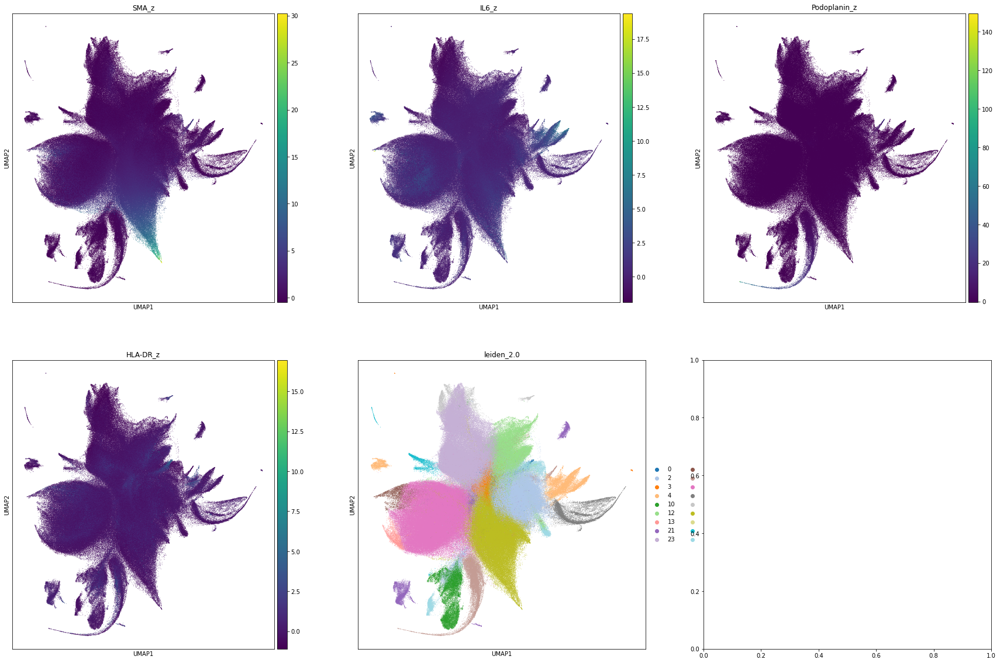

In [14]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(30,20))
axs = axs.flatten()

for i, marker in enumerate(['SMA_z', 'IL6_z', 'Podoplanin_z', 'HLA-DR_z']):
    sc.pl.umap(adata=adata_stroma, color=marker, palette='tab20', size=2, ax=axs[i], show=False)

sc.pl.umap(adata=adata_stroma, color=f'leiden_2.0', palette='tab20', size=2, ax=axs[4], show=False)


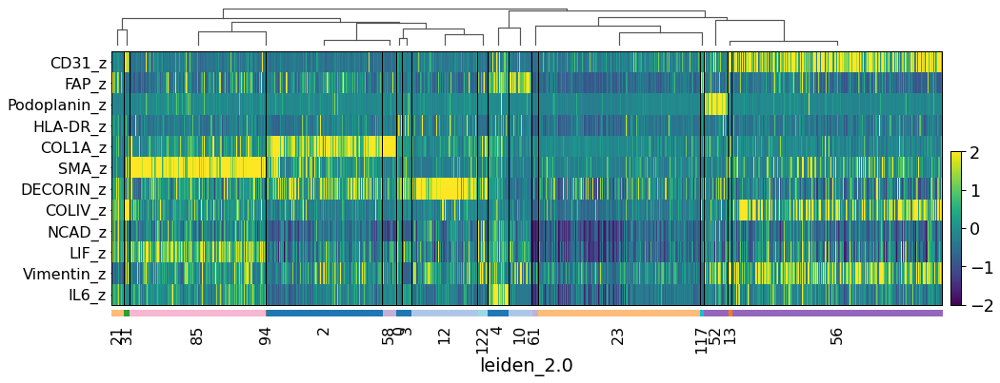

In [14]:
stromal_markers = ['CD31_z', 'COLIV_z', 'NCAD_z', 'LIF_z', 'FAP_z', 'SMA_z', 'HLA-DR_z', 'IL6_z', 'Vimentin_z', 'Podoplanin_z', 'DECORIN_z', 'COL1A_z']
stromal_mask = np.isin(adata.var_names, stromal_markers)

sc.pl.heatmap(adata=adata_stroma, var_names=adata.var_names[stromal_mask], groupby='leiden_2.0', vmin=-2, vmax=2, dendrogram=True, swap_axes=True, figsize=(16,6))

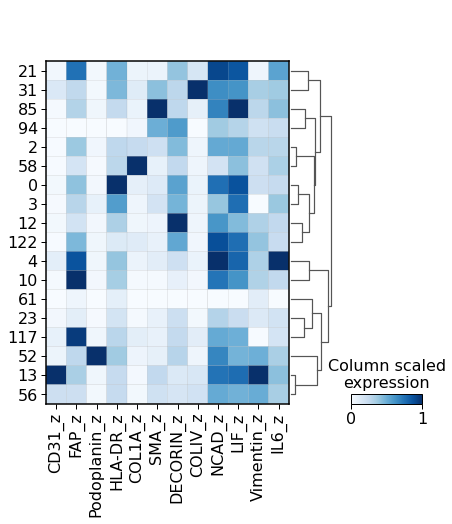

In [15]:
sc.pl.matrixplot(adata_stroma, var_names=adata_stroma.var_names[stromal_mask], groupby='leiden_2.0', dendrogram=True, cmap='Blues', standard_scale='var', colorbar_title="Column scaled\nexpression")

In [18]:
## Load the leiden clusters for these TMAs

# clusters_frame['core_ID'] = clusters_frame['slides'].apply(lambda x: x.split('_')[2])
# clusters_frame['TMA'] = clusters_frame['core_ID'].apply(lambda x: x.split('-')[0])
clusters_frame = clusters_frame.drop(columns=['tiles', 'hist_subtype', 'labels', 'patterns'])
clusters_frame = clusters_frame.loc[(clusters_frame['TMA'] == '12') | (clusters_frame['TMA'] == '13') | (clusters_frame['TMA'] == '21') | (clusters_frame['TMA'] == '22')]
clusters_frame

,Unnamed: 0,samples,slides,leiden_2.5,os_event_ind,os_event_data,core_ID,TMA,core
103,103.0,ACA_0670,ACA_0670_13-13-B,35,0.0,126.115068,13-13-B,13,13-13-B
104,104.0,ACA_0670,ACA_0670_13-13-B,35,0.0,126.115068,13-13-B,13,13-13-B
105,105.0,ACA_0670,ACA_0670_13-13-B,35,0.0,126.115068,13-13-B,13,13-13-B
106,106.0,ACA_0670,ACA_0670_13-13-B,35,0.0,126.115068,13-13-B,13,13-13-B
107,107.0,ACA_0670,ACA_0670_13-14-B,46,0.0,126.115068,13-14-B,13,13-14-B
...,...,...,...,...,...,...,...,...,...
3041,NaN,ACA_1060,ACA_1060_22-09-H,61,NaN,NaN,22-09-H,22,22-09-H
3050,NaN,ACA_0984,ACA_0984_21-03-A,13,NaN,NaN,21-03-A,21,21-03-A
3051,NaN,ACA_0984,ACA_0984_21-03-A,68,NaN,NaN,21-03-A,21,21-03-A
3052,NaN,ACA_0984,ACA_0984_21-03-A,13,NaN,NaN,21-03-A,21,21-03-A


In [19]:
pivot_clusters_frame = pd.get_dummies(clusters_frame, prefix='cluster', columns=['leiden_2.5'])
pivot_clusters_frame = pivot_clusters_frame.groupby(by='core_ID').sum().reset_index()
pivot_clusters_frame

/tmp/ipykernel_349923/814431812.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  pivot_clusters_frame = pivot_clusters_frame.groupby(by='core_ID').sum().reset_index()


,core_ID,Unnamed: 0,os_event_ind,os_event_data,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,...,cluster_60,cluster_61,cluster_62,cluster_63,cluster_64,cluster_65,cluster_67,cluster_68,cluster_69,cluster_70
0,12-02-A,9426.0,4.0,0.920548,0,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,0
1,12-02-B,18174.0,0.0,436.208219,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,12-02-C,24482.0,4.0,30.772603,0,0,0,0,0,0,...,0,0,0,0,0,0,3,0,0,0
3,12-02-D,2481.0,0.0,117.106849,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,12-02-F,6543.0,2.0,0.789041,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,22-15-B,0.0,0.0,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
413,22-15-D,0.0,0.0,0.000000,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
414,22-15-E,0.0,0.0,0.000000,0,0,0,0,0,0,...,2,0,0,0,0,0,0,0,0,0
415,22-15-I,0.0,0.0,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [24]:
majority_clusters_frame = pivot_clusters_frame.copy(deep=True)

majority_clusters_frame = majority_clusters_frame[['core_ID']+[col for col in majority_clusters_frame.columns.values[4:] if int(col.split('cluster_')[1]) in tier1_malignant_nonecrosis]]
# majority_clusters_frame = majority_clusters_frame[['core_ID']+[col for col in majority_clusters_frame.columns.values[1:] if int(col.split('cluster_')[1]) in tier1_malignant_nonecrosis]]
majority_clusters_frame

,core_ID,cluster_0,cluster_5,cluster_10,cluster_11,cluster_13,cluster_16,cluster_17,cluster_21,cluster_27,...,cluster_47,cluster_48,cluster_50,cluster_52,cluster_54,cluster_61,cluster_64,cluster_67,cluster_68,cluster_69
0,12-02-A,0,0,0,0,0,0,0,0,2,...,0,0,0,0,0,0,0,0,0,0
1,12-02-B,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,12-02-C,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,3,0,0
3,12-02-D,0,0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,12-02-F,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,22-15-B,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
413,22-15-D,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
414,22-15-E,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
415,22-15-I,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0


In [25]:
majority_clusters_frame['max'] = majority_clusters_frame.max(numeric_only=True, axis=1)
majority_clusters_frame['sum'] = majority_clusters_frame.iloc[:, :-1].sum(numeric_only=True, axis=1)

majority_clusters_frame

,core_ID,cluster_0,cluster_5,cluster_10,cluster_11,cluster_13,cluster_16,cluster_17,cluster_21,cluster_27,...,cluster_50,cluster_52,cluster_54,cluster_61,cluster_64,cluster_67,cluster_68,cluster_69,max,sum
0,12-02-A,0,0,0,0,0,0,0,0,2,...,0,0,0,0,0,0,0,0,2,2
1,12-02-B,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2,2
2,12-02-C,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,3,0,0,3,4
3,12-02-D,0,0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2,2
4,12-02-F,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,22-15-B,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
413,22-15-D,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,1,2
414,22-15-E,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
415,22-15-I,0,0,0,0,0,0,0,0,0,...,2,0,0,0,0,0,0,0,2,2


<Axes: xlabel='sum', ylabel='count'>

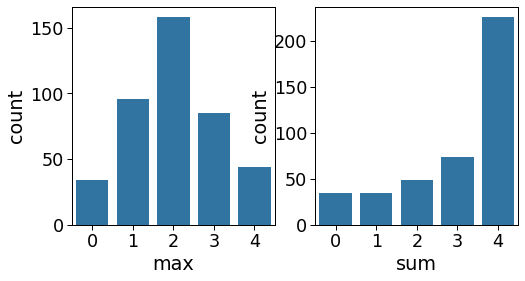

In [26]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8,4))
axs = axs.flatten()

sns.countplot(x='max', data=majority_clusters_frame, ax=axs[0])
sns.countplot(x='sum', data=majority_clusters_frame, ax=axs[1])

In [27]:
cluster_pure_cores = majority_clusters_frame.loc[(majority_clusters_frame['max'] == 4) | (majority_clusters_frame['max'] == 3)]
cluster_pure_cores['cluster'] = cluster_pure_cores.iloc[:, :-2].idxmax(numeric_only=True, axis=1)
cluster_pure_cores['cluster'].value_counts()

/tmp/ipykernel_349923/2380281612.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_pure_cores['cluster'] = cluster_pure_cores.iloc[:, :-2].idxmax(numeric_only=True, axis=1)


cluster_52    13
cluster_11    12
cluster_47     9
cluster_50     9
cluster_41     9
cluster_64     8
cluster_13     7
cluster_46     7
cluster_67     6
cluster_28     6
cluster_17     5
cluster_44     5
cluster_27     5
cluster_21     4
cluster_48     4
cluster_54     4
cluster_68     4
cluster_69     2
cluster_34     2
cluster_0      2
cluster_16     2
cluster_31     1
cluster_61     1
cluster_30     1
cluster_10     1
Name: cluster, dtype: int64

In [28]:
cluster_pure_cores

,core_ID,cluster_0,cluster_5,cluster_10,cluster_11,cluster_13,cluster_16,cluster_17,cluster_21,cluster_27,...,cluster_52,cluster_54,cluster_61,cluster_64,cluster_67,cluster_68,cluster_69,max,sum,cluster
2,12-02-C,0,0,0,0,0,0,0,0,0,...,0,0,0,0,3,0,0,3,4,cluster_67
6,12-02-H,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,3,4,cluster_41
7,12-02-I,0,0,0,1,0,0,0,0,0,...,3,0,0,0,0,0,0,3,4,cluster_52
10,12-03-B,1,0,0,0,0,0,0,0,0,...,0,0,0,0,3,0,0,3,4,cluster_67
11,12-03-C,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,3,4,cluster_50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,22-11-J,0,0,3,0,0,1,0,0,0,...,0,0,0,0,0,0,0,3,4,cluster_10
397,22-13-C,0,0,0,3,0,0,0,0,0,...,0,0,0,0,0,0,0,3,3,cluster_11
401,22-13-H,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,3,4,cluster_28
408,22-14-G,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,3,0,3,4,cluster_68


In [29]:
def replace_gt_one(x):
    if pd.api.types.is_numeric_dtype(x):
        return np.where(x > 1, 1, x)
    else:
        return x

clusters_frame_onehot = pivot_clusters_frame.apply(replace_gt_one)
clusters_frame_onehot

,core_ID,Unnamed: 0,os_event_ind,os_event_data,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,...,cluster_60,cluster_61,cluster_62,cluster_63,cluster_64,cluster_65,cluster_67,cluster_68,cluster_69,cluster_70
0,12-02-A,1.0,1.0,0.920548,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,12-02-B,1.0,0.0,1.000000,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,12-02-C,1.0,1.0,1.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,12-02-D,1.0,0.0,1.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,12-02-F,1.0,1.0,0.789041,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,22-15-B,0.0,0.0,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
413,22-15-D,0.0,0.0,0.000000,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
414,22-15-E,0.0,0.0,0.000000,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
415,22-15-I,0.0,0.0,0.000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [30]:
for col in clusters_frame_onehot.columns:
    if col.startswith('cluster'):
        clusters_frame_onehot[col] = clusters_frame_onehot[col].astype('category')

In [31]:
# adata.obs = adata.obs.merge(clusters_frame_onehot, on='core_ID', how='left')
adata.obs = adata.obs.merge(cluster_pure_cores[['core_ID', 'cluster']], on='core_ID', how='left')
adata.obs_names = [f"Cell_{i:d}" for i in range(adata.n_obs)]
adata.obs

/mnt/cephfs/home/users/krakovic/.conda/envs/scpy/lib/python3.10/site-packages/anndata/_core/anndata.py:859: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


,core_ID,CellX,CellY,TMA,samples,leiden_0.5,leiden_0.6,leiden_0.8,leiden_1.0,leiden_1.5,leiden_2.0,cell_lineage,immune_lineage,cluster
Cell_0,12-15-J,2396.8,6263.1,12,ACA_0662,21,26,25,31,45,56,stroma,NaN,NaN
Cell_1,12-15-J,2420.0,6264.4,12,ACA_0662,5,30,18,38,5,5,tumour,NaN,NaN
Cell_2,12-15-J,2428.9,6265.5,12,ACA_0662,5,30,18,38,65,5,tumour,NaN,NaN
Cell_3,12-15-J,2409.4,6267.8,12,ACA_0662,5,30,18,38,5,5,tumour,NaN,NaN
Cell_4,12-15-J,2474.5,6266.5,12,ACA_0662,9,13,28,33,51,62,unclassifiable,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cell_2670918,22-15-J,17607.6,20332.7,22,ACA_1069,26,13,36,45,58,75,immune,CD45+ CD4+,NaN
Cell_2670919,22-15-J,17733.6,20460.9,22,ACA_1069,26,15,9,13,21,27,immune,CD45+ CD20+,NaN
Cell_2670920,22-15-J,17500.8,20961.7,22,ACA_1069,26,15,33,45,10,12,stroma,NaN,NaN
Cell_2670921,22-15-J,17685.7,20402.6,22,ACA_1069,26,20,36,45,21,27,immune,CD45+ CD20+,NaN


In [32]:
pure_adata = adata[~adata.obs['cluster'].isna()]
pure_adata.obs

,core_ID,CellX,CellY,TMA,samples,leiden_0.5,leiden_0.6,leiden_0.8,leiden_1.0,leiden_1.5,leiden_2.0,cell_lineage,immune_lineage,cluster
Cell_36620,12-14-J,2474.0,7741.1,12,ACA_0662,5,30,18,38,34,5,tumour,NaN,cluster_52
Cell_36621,12-14-J,2585.0,7743.0,12,ACA_0662,9,39,18,33,34,43,tumour,NaN,cluster_52
Cell_36622,12-14-J,2463.2,7744.5,12,ACA_0662,5,30,18,38,34,5,tumour,NaN,cluster_52
Cell_36623,12-14-J,2373.3,7746.8,12,ACA_0662,5,30,18,38,34,5,tumour,NaN,cluster_52
Cell_36624,12-14-J,2470.8,7748.9,12,ACA_0662,5,30,18,38,5,5,tumour,NaN,cluster_52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cell_2611108,22-14-H,14474.6,20123.6,22,ACA_1061,14,37,14,22,32,41,immune,CD45+ CD8+,cluster_28
Cell_2611109,22-14-H,13577.4,19865.8,22,ACA_1061,14,37,14,22,32,41,immune,CD45+ CD8+,cluster_28
Cell_2611110,22-14-H,14412.7,20449.6,22,ACA_1061,14,37,14,22,32,41,immune,CD45+ CD8+,cluster_28
Cell_2611111,22-14-H,14369.8,20477.1,22,ACA_1061,9,13,36,49,58,79,unclassifiable,NaN,cluster_28
